In [1]:
import numpy as np 
import pandas as pd
import os
import glob
import fnmatch
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objects as go

from plotly.subplots import make_subplots
import plotly.graph_objects as go
from pympler.asizeof import asizeof

In [2]:
from lib.data_classes.pffpFolder import pffpDataFolder
from lib.signal_processing.signal_function import moving_average, find_deriv_change

In [17]:
# Testing the binary file classa
#TODO: for some reason I need the full path to read the files, I'll need to look into this in the future
folder_dir = r"/home/sandbiter/Documents/BlueDrop_Analysis_Lib/Mouth_1"

# folder_dir = r"/home/sandbiter/Documents/BlueDrop_Analysis_Lib/wetransfer_potomac_to-jonathan_2024-03-29_1334"
# folder_dir = r"//home/sandbiter/Documents/BlueDrop_Analysis_Lib/Clay_Air_Drops_GBE_AdamsPoint"
calibration_dir = r"BlueDrop_Calibration_Factors.xlsx"

In [18]:
# TODO: Combine the pffp_id and the read_calibration_excel_sheet just have the objet call inside

test_folder = pffpDataFolder(folder_dir, pffp_id = 3, calibration_factor_dir=calibration_dir)
print(test_folder)

Folder: /home/sandbiter/Documents/BlueDrop_Analysis_Lib/wetransfer_potomac_to-jonathan_2024-03-29_1334 
Date range: Not set 
PFFP id: 3                 
Calibration Param dir: BlueDrop_Calibration_Factors.xlsx 
Num .bin files: 488                 
Num files with drops: Not Set


In [19]:
# Read the calibration data
test_folder.read_calibration_excel_sheet("bluedrop_3")
test_folder.calibration_excel_sheet

# Select the specific calibration params
test_folder.get_sensor_calibration_params("Sequim_2021")

# Display Calibration params
display(test_folder.calibration_params)

# Init a pffpFile instances for each binary file and store the results in the folder
test_folder.store_pffp_files()

pffp_file_id = 10
print(test_folder.pffp_files[pffp_file_id])

# Get the sensor data
df = test_folder.pffp_files[pffp_file_id].binary_2_sensor_df(acceleration_unit = "g")
display(df.head())

,Sensor,Sequim_2021_offset,Sequim_2021_scale
0,2g_accel,-34426.50,1615925.8
1,18g_accel,12322.10,163530.7
2,50g_accel,-244513.80,63651.0
3,200g_accel,-262332.40,38888.7
4,250g_accel,-40536.10,13631.6
5,55g_x_tilt,-59093.70,66674.3
6,55g_y_tilt,-140224.60,66674.3
7,pore_pressure,-51617.54,20705.0


File Directory: /home/sandbiter/Documents/BlueDrop_Analysis_Lib/wetransfer_potomac_to-jonathan_2024-03-29_1334/Potomac_to Jonathan/bLog0F61.bin 
Num Drops in file: Not Checked         
Drop Date: 2024-03-29 
Drop Time: 11:24:44 


,Time,2g_accel,18g_accel,50g_accel,pore_pressure,200g_accel,55g_x_tilt,55g_y_tilt,250g_accel
0,0.000000,0.983533,0.978288,0.967702,8.190948,1.895707,0.166710,0.074233,1.119230
1,0.000008,0.984170,0.974759,0.980145,7.990482,1.891696,0.161941,0.069283,0.996427
2,0.000017,0.978978,0.973469,0.986476,7.444696,1.885782,0.177599,0.078192,0.967964
3,0.000025,0.974635,0.971757,0.952211,6.937537,1.886759,0.185908,0.067768,1.040003
4,0.000033,0.967063,0.965098,0.940444,8.111694,1.878582,0.186943,0.064514,1.075802


In [20]:
# df_list = []

# for i, file in enumerate(test_folder.pffp_files[:3]):

#     # select the accelerometer of interest
#     selected_accelerometer = "18g_accel"

#     # Get the acceleration data
#     df_list.append( file.binary_2_sensor_df(acceleration_unit = "g") )


In [21]:
test_folder.analyze_all_files()

Folder '/home/sandbiter/Documents/BlueDrop_Analysis_Lib/wetransfer_potomac_to-jonathan_2024-03-29_1334/no_drop_folder' already exists.

Progress analysing drops...
[=======================---------------------------] 46.31% ETA (min): 3.8

In [8]:
print(test_folder.pffp_drop_files[-2].drops[0].peak_info)

{'peak_heights': array([3.44518858, 6.46300114])}


In [9]:

# for i, file in enumerate(test_folder.pffp_drop_files):
#     df = file.binary_2_sensor_df(acceleration_unit = "g")

#     print(file.file_name)
#     print("Num drops: ", test_folder.num_drop_files)

#     fig, axs = plt.subplots(ncols =1, nrows = 2)

#     axs[0].plot(df["Time"], df["18g_accel"])
#     axs[1].plot(df["Time"], df["pore_pressure"])

#     plt.show()


In [10]:
# Loop over the files in the folder check if they have a drop in them

for i, file in enumerate(test_folder.pffp_files):

    # # select the accelerometer of interest
    # selected_accelerometer = "18g_accel"

    # # Get the acceleration data
    # df = file.binary_2_sensor_df(acceleration_unit = "g")

    accel = df_list[i][selected_accelerometer]
    time = df_list[i]["Time"]

    # Check if there's a drop in the file
    print(f"Index: {i}")
    file.get_num_drops(accel)
    print("Num drops: {}".format(file.num_drops))
    print(file.check_drop_in_file())


NameError: name 'df_list' is not defined

### Questions that I need to answer
1) how long is a drop? I want to be able to trim the df files around a drop
2) 

In [ ]:
# select the accelerometer of interest
selected_accelerometer = "18g_accel"

# Convert the df to a np array
accel = np.array(df[selected_accelerometer])
df_time = np.array(df["Time"])

test_folder.pffp_files[pffp_file_id].get_num_drops(accel)

test_folder.pffp_files[pffp_file_id].check_drop_in_file()

False

In [ ]:
# Smooth the drop

# Get an intial guess if there's a drop in the file

# Do some other checks to see if it's a drop
# Find the start and end of the drop

from scipy.signal import find_peaks
      

def find_drops(accel_data, impact_time_tol = 0.015, sample_freq = 120_000, min_peak_height = 2.8):
    # Purpose: Get a first estimate of the number of drops in a file

    # time_tolerance: Expected time difference between drops - asumme 0.5 seconds for the time being
    # sample_freq: sample frequency of the data assumed to have the same units as time_tolerance

    # Calc assumed tolerance for the length of impact
    impact_window = impact_time_tol * sample_freq

    drop_indexs, drop_info = find_peaks(accel_data, height = min_peak_height, distance = impact_window)
    
    num_drops = len(drop_indexs)

    return drop_indexs, drop_info, num_drops

# drop_index, drop_info, num_drops = find_drops(averaged_accel)
drop_index, drop_info, num_drops = find_drops(accel)
print("drops index: ", drop_index)

# if num_drops > 0:
#     print("Drop Info: ", drops)
#     print("Peak time of drops: ", time[drops])



drops index:  []


In [ ]:
# For each drop index select the part of the 
frequency = 120_000
time_window = 0.01
index_window = int(time_window * frequency)
print(index_window)
# index_arr = np.array([drop_index[0] - index_window: drop_index[0] + index_window])
# print(index_arr)
print(len(time))

# Calc the gradient of the plot

deriv_changes_index = find_deriv_change(df_time[drop_index[0] - index_window: drop_index[0] + index_window], averaged_accel[drop_index[0] - index_window: drop_index[0] + index_window], 300)[0] + drop_index[0]

# Calc the derivative of the index window
acceleration_derivative = np.gradient(averaged_accel[drop_index[0] - index_window: drop_index[0] + index_window], df_time[drop_index[0] - index_window: drop_index[0] + index_window])
plt.plot(time[drop_index[0] - index_window: drop_index[0] + index_window], acceleration_derivative)

1200
120000


IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
# function to find the first time a signal reaches a point after a certain index

def find_signal_value(signal, value, start_index, end_index = None, num_occurrences = 1, tolerance = 1e-5):
    # Purpose: Find where a signal equals a value after a certain starting index within a tolerance

    # select the part of the signal of interest
    selected_signal = signal[start_index:end_index]

    # Subtract off the value
    arr = selected_signal - value

    # Find the location where the difference is less than the tolerance
    indices = np.where((-tolerance < arr) & (arr < tolerance))[0]
    print(start_index + indices)
    # Select the number of occurences wanted
    return start_index + indices[:num_occurrences]

arr = np.linspace(0,1, 3)
    
# Find where the signal goes back to a certain value
# start_drop_index = find_signal_value(averaged_accel, value = 1.2, start_index = drop_index[0] - index_window, end_index = drop_index[0], num_occurrences=1, tolerance = 1e-1)
# end_drop_index = find_signal_value(averaged_accel, value = 0.99, start_index = drop_index[0], num_occurrences=1, tolerance = 1e-1)

start_drop_index = find_signal_value(accel, value = 1.2, start_index = drop_index[0] - index_window, end_index = drop_index[0], num_occurrences=1, tolerance = 1e-1)
end_drop_index = find_signal_value(accel, value = 0.99, start_index = drop_index[0], num_occurrences=1, tolerance = 1e-1)

print(f"start index: {start_drop_index}")
print(f"end index: {end_drop_index}")

[42148 42150 42151 42152 42153 42154 42155 42156 42157 42158 42159 42160
 42161 42162 42163 42164 42165 42166 42167 42168 42169 42170]
[ 42534  42535  42536 ... 119968 119969 119970]
start index: [42148]
end index: [42534]


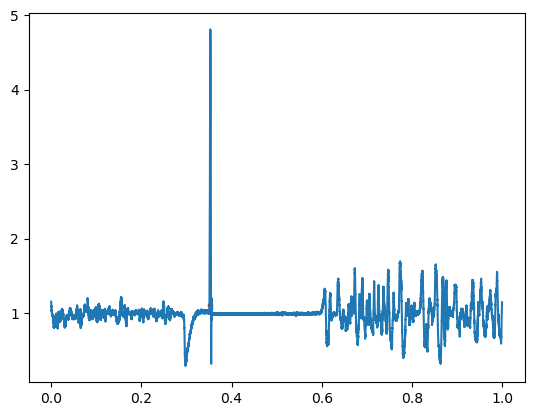

In [ ]:
start = drop_index[0] - index_window
end = drop_index[0]

plt.plot(df_time, accel)
plt.scatter(df_time[start_drop_index], accel[start_drop_index], marker = ".", color = "red")
plt.scatter(df_time[end_drop_index], accel[end_drop_index], marker = ".", color = "red", s = 10)
# plt.plot(time[start:end], averaged_accel[start:end])

In [ ]:


fig = make_subplots(rows = 2, cols = 1)

# PLot the smoothed acceleration
fig.add_trace(
    go.Scatter(x = df_time, y = accel, mode = "lines", name = "intial"),
    row = 1, col = 1
)

# PLot the smoothed acceleration
fig.add_trace(
    go.Scatter(x = time, y = averaged_accel, mode = "lines", name = "smoothed"),
    row = 1, col = 1
)

# Plot the location where the derivative meets the criteria
fig.add_trace(
    go.Scatter(x = df_time[deriv_changes_index], y = accel[deriv_changes_index], mode = "markers", name = "deriv_changes"),
    row = 1, col = 1
)

# Plot the location of the peak 
fig.add_trace(
    go.Scatter(x = df_time[drop_index], y = accel[drop_index], mode = "markers", name = "drop peak"),
    row = 1, col = 1
)

# Plot the beginning of the drop
fig.add_trace(
    go.Scatter(x = df_time[start_drop_index], y = accel[start_drop_index], mode = "markers", name = "begin drop"),
    row = 1, col = 1
)

# Plot the predicted end of drop
fig.add_trace(
    go.Scatter(x = df_time[end_drop_index], y = accel[end_drop_index], mode = "markers", name = "drop end"),
    row = 1, col = 1
)

# Plot the derivative of the acceleration
fig.add_trace(
    go.Scatter(x = time[drop_index[0] - index_window: drop_index[0] + index_window], y = acceleration_derivative, mode = "lines", name = "derivative"),
    row = 2, col = 1
)

fig.show()

### Steps to get the drops from a file
1) Trim the data to be around the drops
2) 

### Functions that should be created

#### Plotting

#### Spike identificaiton
    * Acceleration threshold
    * derivative check
    * Find peaks using
#### Filtering
